# Importing Modules

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from scipy import stats
import statsmodels.api as sm
import pickle 
from os import path


from sklearn import metrics
from sklearn.model_selection import train_test_split 
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor
from xgboost import XGBRegressor

# Importing Datasets

In [2]:
data = pd.read_csv('train.csv')
stores = pd.read_csv('stores.csv')
features = pd.read_csv('features.csv')

In [3]:
data.shape

(421570, 5)

In [4]:
data.head()

,Store,Dept,Date,Weekly_Sales,IsHoliday
0,1,1,2010-02-05,24924.50,False
1,1,1,2010-02-12,46039.49,True
2,1,1,2010-02-19,41595.55,False
3,1,1,2010-02-26,19403.54,False
4,1,1,2010-03-05,21827.90,False


In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 421570 entries, 0 to 421569
Data columns (total 5 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   Store         421570 non-null  int64  
 1   Dept          421570 non-null  int64  
 2   Date          421570 non-null  object 
 3   Weekly_Sales  421570 non-null  float64
 4   IsHoliday     421570 non-null  bool   
dtypes: bool(1), float64(1), int64(2), object(1)
memory usage: 13.3+ MB


In [6]:
from pandas_profiling import ProfileReport

# Create the report
profile = ProfileReport(data)

# Generate the report in an iframe in the notebook
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [7]:
stores.shape

(45, 3)

In [8]:
stores.head()

,Store,Type,Size
0,1,A,151315
1,2,A,202307
2,3,B,37392
3,4,A,205863
4,5,B,34875


In [9]:
stores.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45 entries, 0 to 44
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Store   45 non-null     int64 
 1   Type    45 non-null     object
 2   Size    45 non-null     int64 
dtypes: int64(2), object(1)
memory usage: 1.2+ KB


In [10]:
# Create the report
profile_store = ProfileReport(stores)

# Generate the report in an iframe in the notebook
profile_store.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [11]:
features.shape

(8190, 12)

In [12]:
features.tail()

,Store,Date,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday
8185,45,2013-06-28,76.05,3.639,4842.29,975.03,3.00,2449.97,3169.69,NaN,NaN,False
8186,45,2013-07-05,77.50,3.614,9090.48,2268.58,582.74,5797.47,1514.93,NaN,NaN,False
8187,45,2013-07-12,79.37,3.614,3789.94,1827.31,85.72,744.84,2150.36,NaN,NaN,False
8188,45,2013-07-19,82.84,3.737,2961.49,1047.07,204.19,363.00,1059.46,NaN,NaN,False
8189,45,2013-07-26,76.06,3.804,212.02,851.73,2.06,10.88,1864.57,NaN,NaN,False


In [13]:
features.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8190 entries, 0 to 8189
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Store         8190 non-null   int64  
 1   Date          8190 non-null   object 
 2   Temperature   8190 non-null   float64
 3   Fuel_Price    8190 non-null   float64
 4   MarkDown1     4032 non-null   float64
 5   MarkDown2     2921 non-null   float64
 6   MarkDown3     3613 non-null   float64
 7   MarkDown4     3464 non-null   float64
 8   MarkDown5     4050 non-null   float64
 9   CPI           7605 non-null   float64
 10  Unemployment  7605 non-null   float64
 11  IsHoliday     8190 non-null   bool   
dtypes: bool(1), float64(9), int64(1), object(1)
memory usage: 712.0+ KB


In [14]:
# Create the report
profile_feat = ProfileReport(features)

# Generate the report in an iframe in the notebook
profile_feat.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Handling Missing Values

In [15]:

# Get the number of missing values in each column
missing_values = features.isnull().sum()
print("Missing values before handling:")
print(missing_values)

# Fill in missing values with the median of each column
features["CPI"].fillna(features["CPI"].median(), inplace=True)
features["Unemployment"].fillna(features["Unemployment"].median(), inplace=True)

# Get the number of missing values in each column again
missing_values = features.isnull().sum()
print("Missing values after handling:")
print(missing_values)

Missing values before handling:
Store              0
Date               0
Temperature        0
Fuel_Price         0
MarkDown1       4158
MarkDown2       5269
MarkDown3       4577
MarkDown4       4726
MarkDown5       4140
CPI              585
Unemployment     585
IsHoliday          0
dtype: int64
Missing values after handling:
Store              0
Date               0
Temperature        0
Fuel_Price         0
MarkDown1       4158
MarkDown2       5269
MarkDown3       4577
MarkDown4       4726
MarkDown5       4140
CPI                0
Unemployment       0
IsHoliday          0
dtype: int64


In [16]:
# Identify columns for Markdown
markdown_cols = [f"MarkDown{i}" for i in range(1,6)]

# For each column in markdown_cols, replace negative values with 0 and fill missing values with 0
for col in markdown_cols:
    features[col] = features[col].apply(lambda x: 0 if x < 0 else x)
    features[col].fillna(value=0,inplace=True)

In [17]:
features.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8190 entries, 0 to 8189
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Store         8190 non-null   int64  
 1   Date          8190 non-null   object 
 2   Temperature   8190 non-null   float64
 3   Fuel_Price    8190 non-null   float64
 4   MarkDown1     8190 non-null   float64
 5   MarkDown2     8190 non-null   float64
 6   MarkDown3     8190 non-null   float64
 7   MarkDown4     8190 non-null   float64
 8   MarkDown5     8190 non-null   float64
 9   CPI           8190 non-null   float64
 10  Unemployment  8190 non-null   float64
 11  IsHoliday     8190 non-null   bool   
dtypes: bool(1), float64(9), int64(1), object(1)
memory usage: 712.0+ KB


# Merging Training Dataset

In [18]:
# Merge the dataframes
data = pd.merge(data,stores,on='Store',how='left')
data = pd.merge(data,features,on=['Store','Date'],how='left')

# Convert the "Date" column to a datetime data type
data['Date'] = pd.to_datetime(data['Date'])

# Sort the dataframe by the "Date" column in ascending order
data.sort_values(by=['Date'],inplace=True)

# Set the "Date" column as the index of the dataframe
data.set_index(data.Date, inplace=True)

In [19]:
data['IsHoliday_x'].isin(data['IsHoliday_y']).all()

True

In [20]:
# Check for duplicate 'IsHoliday' columns and handle them
if 'IsHoliday_x' in data.columns and 'IsHoliday_y' in data.columns:
    if (data['IsHoliday_x'].eq(data['IsHoliday_y'])).all():
        data.drop(columns=['IsHoliday_x'], inplace=True)
        data.rename(columns={'IsHoliday_y': 'IsHoliday'}, inplace=True)
        
# Print the information of the dataframe
data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 421570 entries, 2010-02-05 to 2012-10-26
Data columns (total 16 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   Store         421570 non-null  int64         
 1   Dept          421570 non-null  int64         
 2   Date          421570 non-null  datetime64[ns]
 3   Weekly_Sales  421570 non-null  float64       
 4   Type          421570 non-null  object        
 5   Size          421570 non-null  int64         
 6   Temperature   421570 non-null  float64       
 7   Fuel_Price    421570 non-null  float64       
 8   MarkDown1     421570 non-null  float64       
 9   MarkDown2     421570 non-null  float64       
 10  MarkDown3     421570 non-null  float64       
 11  MarkDown4     421570 non-null  float64       
 12  MarkDown5     421570 non-null  float64       
 13  CPI           421570 non-null  float64       
 14  Unemployment  421570 non-null  float64       
 15  I

In [21]:
data.head()

,Store,Dept,Date,Weekly_Sales,Type,Size,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday
Date,,,,,,,,,,,,,,,,
2010-02-05,1,1,2010-02-05,24924.50,A,151315,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,False
2010-02-05,29,5,2010-02-05,15552.08,B,93638,24.36,2.788,0.0,0.0,0.0,0.0,0.0,131.527903,10.064,False
2010-02-05,29,6,2010-02-05,3200.22,B,93638,24.36,2.788,0.0,0.0,0.0,0.0,0.0,131.527903,10.064,False
2010-02-05,29,7,2010-02-05,10820.05,B,93638,24.36,2.788,0.0,0.0,0.0,0.0,0.0,131.527903,10.064,False
2010-02-05,29,8,2010-02-05,20055.64,B,93638,24.36,2.788,0.0,0.0,0.0,0.0,0.0,131.527903,10.064,False


# Splitting date Column

In [22]:
#Splitting date Column

data['Year'] = data.index.year
data['Month'] = data.index.month
data['Week'] = data.index.isocalendar().week


In [23]:
data.head()

,Store,Dept,Date,Weekly_Sales,Type,Size,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday,Year,Month,Week
Date,,,,,,,,,,,,,,,,,,,
2010-02-05,1,1,2010-02-05,24924.50,A,151315,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,False,2010,2,5
2010-02-05,29,5,2010-02-05,15552.08,B,93638,24.36,2.788,0.0,0.0,0.0,0.0,0.0,131.527903,10.064,False,2010,2,5
2010-02-05,29,6,2010-02-05,3200.22,B,93638,24.36,2.788,0.0,0.0,0.0,0.0,0.0,131.527903,10.064,False,2010,2,5
2010-02-05,29,7,2010-02-05,10820.05,B,93638,24.36,2.788,0.0,0.0,0.0,0.0,0.0,131.527903,10.064,False,2010,2,5
2010-02-05,29,8,2010-02-05,20055.64,B,93638,24.36,2.788,0.0,0.0,0.0,0.0,0.0,131.527903,10.064,False,2010,2,5


# Checking for Outliers

In [24]:
#Checking for Outliers
agg_data = data.groupby(['Store', 'Dept']).Weekly_Sales.agg(['max', 'min', 'mean', 'median', 'std']).reset_index()

# merge the aggregated data with the original dataframe
data = data.merge(right=agg_data, on=['Store', 'Dept'], how='left')

# remove rows with null values
data.dropna(inplace=True)

# Convert the 'Date' column to datetime format
data['Date'] = pd.to_datetime(data['Date'])

# Sort the dataframe by 'Date' column
data.sort_values(by=['Date'],inplace=True)

# Set the 'Date' column as the index of the dataframe
data.set_index(data.Date, inplace=True)

# Print the first 5 rows of the dataframe
data.head()


,Store,Dept,Date,Weekly_Sales,Type,Size,Temperature,Fuel_Price,MarkDown1,MarkDown2,...,Unemployment,IsHoliday,Year,Month,Week,max,min,mean,median,std
Date,,,,,,,,,,,,,,,,,,,,,
2010-02-05,1,1,2010-02-05,24924.50,A,151315,42.31,2.572,0.0,0.0,...,8.106,False,2010,2,5,57592.12,14537.37,22513.322937,18535.48,9854.349032
2010-02-05,9,97,2010-02-05,668.48,B,125833,38.01,2.572,0.0,0.0,...,6.415,False,2010,2,5,766.93,-9.92,372.655556,371.05,290.954675
2010-02-05,9,85,2010-02-05,693.87,B,125833,38.01,2.572,0.0,0.0,...,6.415,False,2010,2,5,2512.14,110.56,876.629441,824.04,307.436056
2010-02-05,8,80,2010-02-05,8654.60,A,155078,34.14,2.572,0.0,0.0,...,6.299,False,2010,2,5,11990.43,7414.43,9188.915105,9161.97,756.223236
2010-02-05,9,55,2010-02-05,11123.56,B,125833,38.01,2.572,0.0,0.0,...,6.415,False,2010,2,5,29166.26,4791.74,8607.050490,7571.60,3874.176095


In [25]:
# Create a new column 'Total_MarkDown' that sums up all the markdown columns
data['Total_MarkDown'] = data[['MarkDown1','MarkDown2','MarkDown3','MarkDown4','MarkDown5']].sum(axis=1)

# Drop the individual markdown columns
data.drop(columns=['MarkDown1','MarkDown2','MarkDown3','MarkDown4','MarkDown5'], inplace=True)

# Create a new dataframe with only the numeric columns
numeric_col = ['Weekly_Sales','Size','Temperature','Fuel_Price','CPI','Unemployment','Total_MarkDown']
data_numeric = data[numeric_col].copy()

# Print the shape of the dataframe
print(data.shape)

(421533, 20)


In [26]:
data = data[(np.abs(stats.zscore(data_numeric)) < 2.5).all(axis = 1)]
data.shape

(375438, 20)

# Checking the Skewness

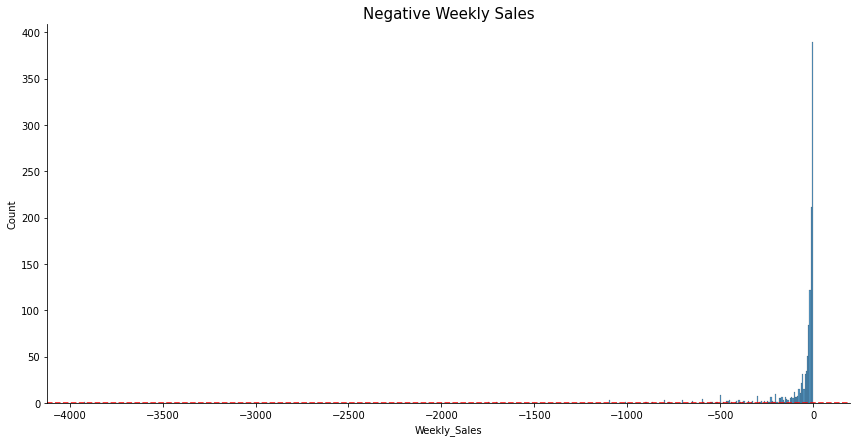

In [27]:
# Checking the Skewness

# Filter the Weekly_Sales column to only include values less than 0
negative_sales = data[data.Weekly_Sales < 0]["Weekly_Sales"]

# Create a histogram plot of the filtered data
sns.displot(negative_sales, height=6, aspect=2, kde=False)

# Add a title to the plot
plt.title("Negative Weekly Sales", fontsize=15)


# Add a line at y=0 to indicate the point at which sales are negative
plt.axhline(y=0, color='red', linestyle='--')

plt.savefig("Negative Weekly Sales.jpg")
# Show the plot
plt.show()

In [28]:
data=data[data['Weekly_Sales']>=0]

In [29]:
data.shape

(374247, 20)

In [30]:
data['IsHoliday'] = data['IsHoliday'].astype('int')

In [31]:
data

,Store,Dept,Date,Weekly_Sales,Type,Size,Temperature,Fuel_Price,CPI,Unemployment,IsHoliday,Year,Month,Week,max,min,mean,median,std,Total_MarkDown
Date,,,,,,,,,,,,,,,,,,,,
2010-02-05,1,1,2010-02-05,24924.50,A,151315,42.31,2.572,211.096358,8.106,0,2010,2,5,57592.12,14537.37,22513.322937,18535.480,9854.349032,0.00
2010-02-05,9,97,2010-02-05,668.48,B,125833,38.01,2.572,214.655459,6.415,0,2010,2,5,766.93,-9.92,372.655556,371.050,290.954675,0.00
2010-02-05,9,85,2010-02-05,693.87,B,125833,38.01,2.572,214.655459,6.415,0,2010,2,5,2512.14,110.56,876.629441,824.040,307.436056,0.00
2010-02-05,8,80,2010-02-05,8654.60,A,155078,34.14,2.572,214.471451,6.299,0,2010,2,5,11990.43,7414.43,9188.915105,9161.970,756.223236,0.00
2010-02-05,9,55,2010-02-05,11123.56,B,125833,38.01,2.572,214.655459,6.415,0,2010,2,5,29166.26,4791.74,8607.050490,7571.600,3874.176095,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2012-10-26,2,26,2012-10-26,9258.88,A,202307,69.79,3.506,223.078337,6.170,0,2012,10,43,19679.04,4179.99,9347.725105,8762.990,2825.107609,9678.80
2012-10-26,38,23,2012-10-26,53.12,C,39690,65.95,4.301,131.193097,10.199,0,2012,10,43,289.78,3.50,37.848679,31.365,34.065601,502.88
2012-10-26,27,6,2012-10-26,5339.65,A,204184,58.99,4.071,142.762411,8.000,0,2012,10,43,41005.33,2524.01,7730.729091,6798.780,5178.928257,10969.27


# Data Visualizations

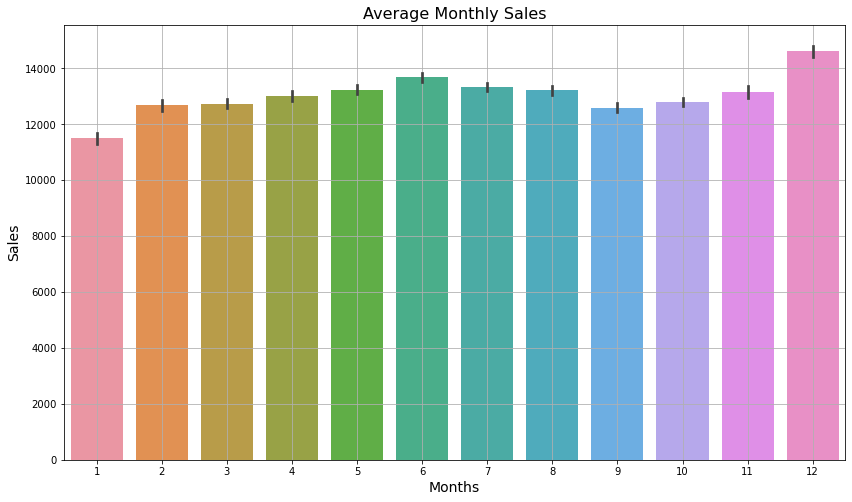

In [32]:
#Average monthly sale

sns.set_palette('pastel')
plt.figure(figsize=(14,8))
sns.barplot(x='Month',y='Weekly_Sales',data=data)
plt.ylabel('Sales',fontsize=14)
plt.xlabel('Months',fontsize=14)
plt.title('Average Monthly Sales',fontsize=16)
plt.savefig('avg_monthly_sales.png')
plt.grid()


In [33]:
data_monthly = pd.crosstab(data["Year"], data["Month"], values=data["Weekly_Sales"],aggfunc='sum')
data_monthly

Month,1,2,3,4,5,6,7,8,9,10,11,12
Year,,,,,,,,,,,,
2010,NaN,1.365986e+08,1.369976e+08,1.753251e+08,1.422677e+08,1.455770e+08,1.776954e+08,1.426176e+08,1.344151e+08,1.687452e+08,1.440445e+08,1.927286e+08
2011,1.170809e+08,1.320987e+08,1.341586e+08,1.710181e+08,1.382097e+08,1.441182e+08,1.762046e+08,1.398143e+08,1.668033e+08,1.375280e+08,1.034907e+08,1.597524e+08
2012,1.172222e+08,8.915290e+07,1.734250e+08,1.479222e+08,1.512280e+08,1.902330e+08,1.458221e+08,1.636039e+08,1.432228e+08,1.480537e+08,NaN,NaN


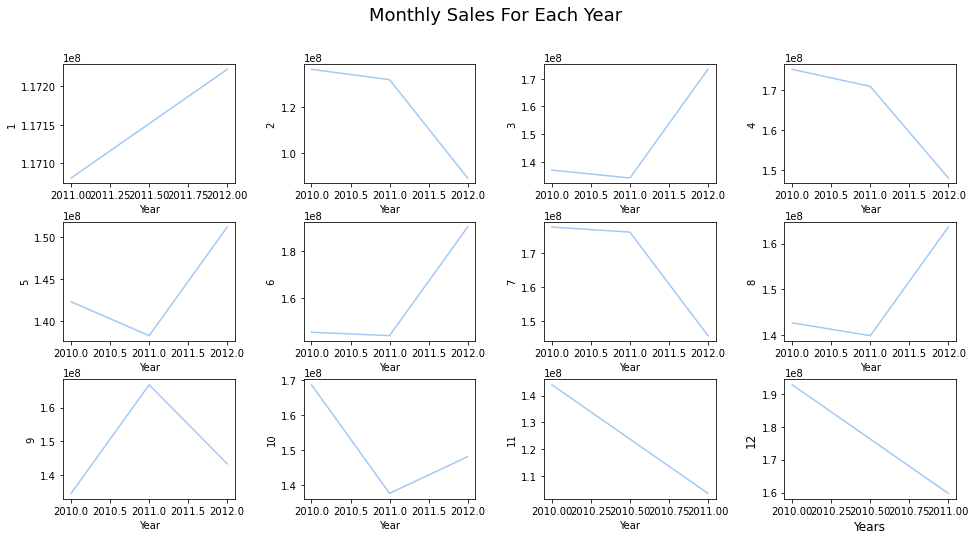

In [34]:
fig, axes = plt.subplots(3,4,figsize=(16,8))
plt.suptitle('Monthly Sales For Each Year', fontsize=18)
k=1
for i in range(3):
    for j in range(4):
      sns.lineplot(ax=axes[i,j],data=data_monthly[k])
      plt.subplots_adjust(wspace=0.4,hspace=0.32)
      plt.ylabel(k,fontsize=12)
      plt.xlabel('Years',fontsize=12)
      k+=1

plt.savefig('Monthly_Sales_For_Each_Year.png')
plt.show()

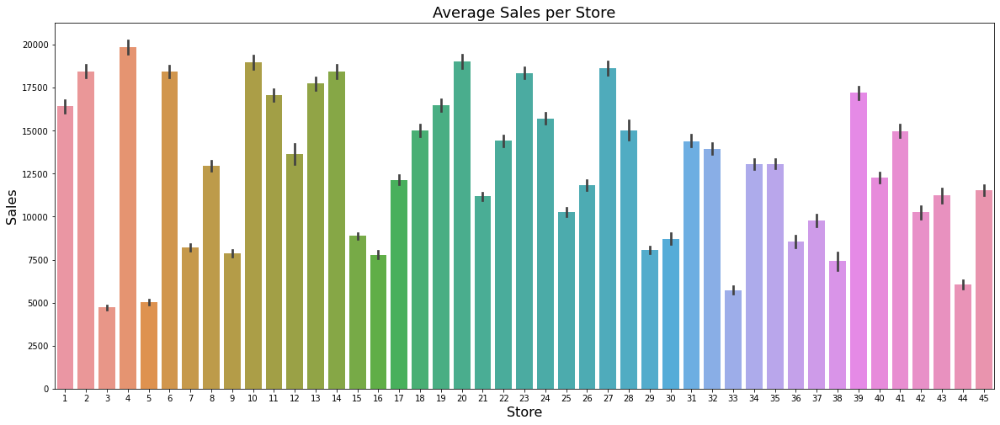

In [35]:
#Average Weekly Sales Store Wise
sns.set_palette('pastel')
plt.figure(figsize=(20,8))
sns.barplot(x='Store',y='Weekly_Sales',data=data)
plt.title('Average Sales per Store', fontsize=18)
plt.ylabel('Sales', fontsize=16)
plt.xlabel('Store', fontsize=16)
plt.savefig('Average_Sales_per_Store.png')
plt.show()

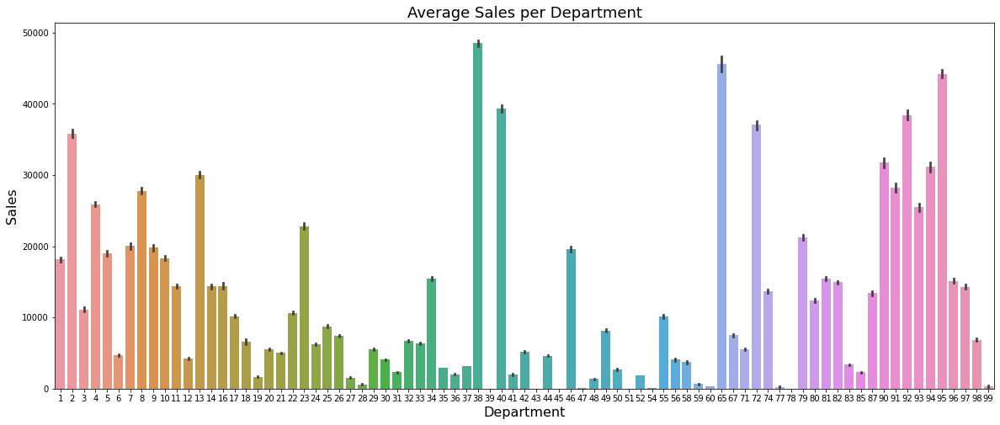

In [36]:
#Average sales per Department
sns.set_palette('pastel')
plt.figure(figsize=(20,8))
sns.barplot(x='Dept',y='Weekly_Sales',data=data)
plt.title('Average Sales per Department', fontsize=18)
plt.ylabel('Sales', fontsize=16)
plt.xlabel('Department', fontsize=16)
plt.savefig('Average_sales_per_dept.png')
plt.show()

C:\Users\Akshay Karadkar\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


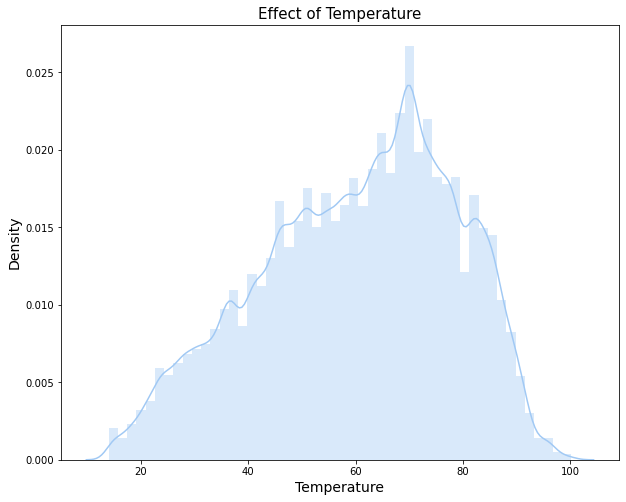

In [37]:
#Sales Vs Tempereture
sns.set_palette('pastel')
plt.figure(figsize=(10,8))
sns.distplot(data['Temperature'])
plt.title('Effect of Temperature',fontsize=15)
plt.xlabel('Temperature',fontsize=14)
plt.ylabel('Density',fontsize=14)
plt.savefig('Effect_of_Temperature.png')
plt.show()

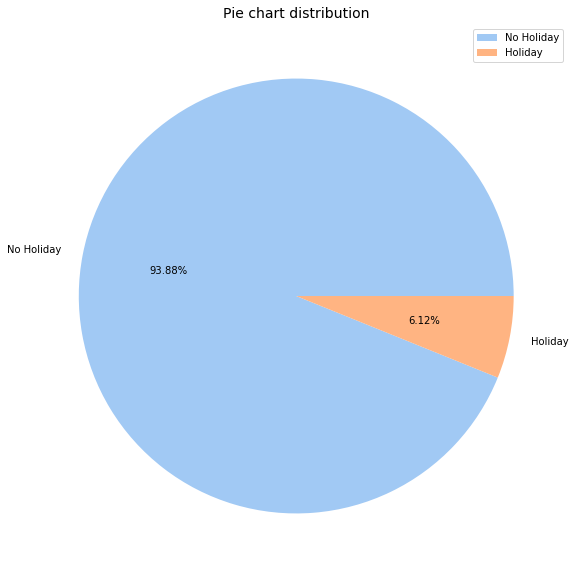

In [38]:
# Holiday Distribution
sns.set_palette('pastel')
plt.figure(figsize=(10,10))
plt.pie(data['IsHoliday'].value_counts(),labels=['No Holiday','Holiday'],autopct='%0.2f%%')
plt.title("Pie chart distribution",fontsize=14)
plt.legend()
plt.savefig('Pie_Chart_holiday_distribution.png')
plt.show()

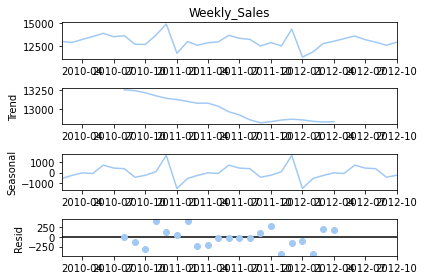

In [39]:
#Time Series Decompose
sm.tsa.seasonal_decompose(data['Weekly_Sales'].resample('MS').mean(), model='additive').plot()
plt.show()

# One hot Encoding

In [40]:
# One hot Encoding

# Copy the categorical columns to a new dataframe
cat_col = ['Store','Dept','Type']
data_cat = data[cat_col].copy()

# Use pandas' get_dummies function to create one-hot encoded versions of the categorical columns
data_cat = pd.get_dummies(data_cat,columns=cat_col, drop_first=True)

# Print the shape of the original dataframe
print(data.shape)

# Concatenate the original dataframe and the one-hot encoded dataframe
data = pd.concat([data, data_cat], axis=1)

# Print the shape of the combined dataframe
print(data.shape)

# Drop the original categorical columns and the 'Date' column
data.drop(columns=cat_col+['Date'], inplace=True)

# Print the final shape of the dataframe
print(data.shape)

(374247, 20)
(374247, 146)
(374247, 142)


# Feature Scaling

In [41]:
# Feature Scaling

from sklearn.preprocessing import MinMaxScaler

# Specify the columns to be scaled
num_col = ['Weekly_Sales','Size','Temperature','Fuel_Price','CPI','Unemployment','Total_MarkDown','max','min','mean','median','std']

# Initialize the MinMaxScaler
scaler = MinMaxScaler(feature_range=(0, 1))

# Scale the specified columns
data[num_col] = scaler.fit_transform(data[num_col])


# Correlation

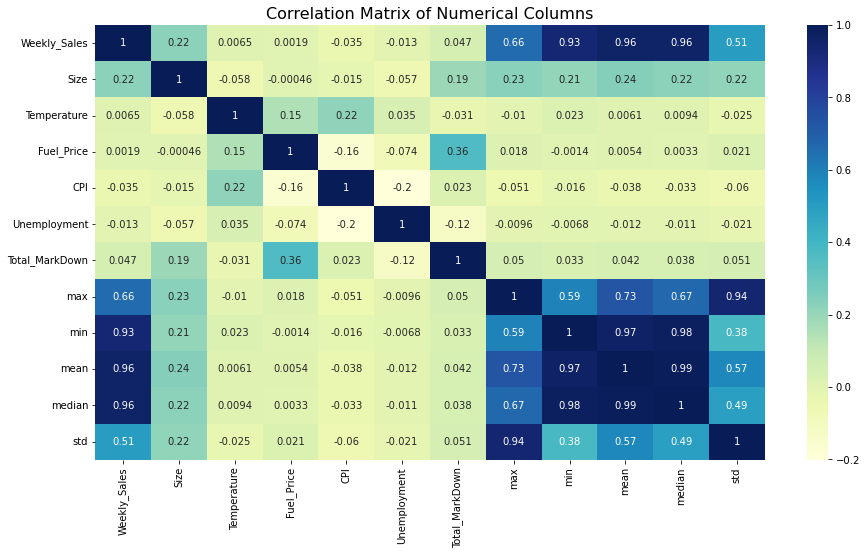

In [42]:
# Adjust the size of the figure
plt.figure(figsize=(15,8))

# Create a correlation matrix of the numerical columns
corr = data[num_col].corr()

# Create a heatmap of the correlation matrix
sns.heatmap(corr, vmax=1.0, annot=True, cmap="YlGnBu")

# Add a title to the heatmap
plt.title("Correlation Matrix of Numerical Columns", fontsize=16)

# Save the figure to a file
plt.savefig('correlation_matrix.png')

# Show the plot
plt.show()


In [43]:
from sklearn.ensemble import RandomForestRegressor

# Create a list of features to use in the model
feature_col = data.columns.difference(['Weekly_Sales'])

# Initialize the RandomForestRegressor
radm_clf = RandomForestRegressor(oob_score=True, n_estimators=23)

# Fit the model to the data
radm_clf.fit(data[feature_col], data['Weekly_Sales'])

# Get the feature importances
importances = radm_clf.feature_importances_

# Create a DataFrame of the feature importances
feature_importances = pd.DataFrame({'feature': feature_col, 'importance': importances})

# Sort the feature importances by importance
feature_importances.sort_values(by='importance', ascending=False, inplace=True)

# Select the top n features
n = 22
top_features = feature_importances.head(n)['feature'].tolist()

# Create a new DataFrame with only the top features
data = data[top_features + ['Weekly_Sales']]

data

C:\Users\Akshay Karadkar\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:586: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable OOB estimates.
  warn(


,mean,median,Week,Temperature,max,CPI,Fuel_Price,min,std,Unemployment,...,Dept_18,IsHoliday,Dept_3,Size,Dept_11,Dept_9,Year,Dept_5,Dept_56,Weekly_Sales
Date,,,,,,,,,,,,,,,,,,,,,
2010-02-05,0.208157,0.173215,5,0.328495,0.088635,0.840500,0.050100,0.253530,0.138276,0.508787,...,0,0,0,0.630267,0,0,2010,0,0,0.342576
2010-02-05,0.004499,0.004767,5,0.278565,0.001180,0.875680,0.050100,0.064648,0.004083,0.305248,...,0,0,0,0.492338,0,0,2010,0,0,0.009188
2010-02-05,0.009135,0.008968,5,0.278565,0.003866,0.875680,0.050100,0.066212,0.004314,0.305248,...,0,0,0,0.492338,0,0,2010,0,0,0.009537
2010-02-05,0.085594,0.086290,5,0.233627,0.018453,0.873861,0.050100,0.161046,0.010611,0.291286,...,0,0,0,0.650636,0,0,2010,0,0,0.118953
2010-02-05,0.080242,0.071542,5,0.278565,0.044887,0.875680,0.050100,0.126993,0.054362,0.305248,...,0,0,0,0.492338,0,0,2010,0,0,0.152888
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2012-10-26,0.087055,0.082590,43,0.647585,0.030286,0.958935,0.518036,0.119050,0.039642,0.275758,...,0,0,0,0.906277,0,0,2012,0,0,0.127259
2012-10-26,0.001419,0.001617,43,0.602996,0.000446,0.050698,0.916333,0.064822,0.000478,0.760713,...,0,0,0,0.026063,0,0,2012,0,0,0.000730
2012-10-26,0.072181,0.064375,43,0.522178,0.063107,0.165055,0.801102,0.097548,0.072670,0.496028,...,0,0,0,0.916437,0,0,2012,0,0,0.073391


# Data Splitting into Training,Validation,Test

In [44]:
#Data Splitting into Training,Validation,Test
X = data.drop(['Weekly_Sales'],axis=1)
Y = data.Weekly_Sales
X_train,X_test,y_train,y_test = train_test_split(X,Y,test_size=0.20, random_state=50)

In [45]:
X = data.drop(['Weekly_Sales'],axis=1)
Y = data.Weekly_Sales

In [46]:
X_train,X_test,y_train,y_test = train_test_split(X,Y,test_size=0.20, random_state=50)

# Linear Regression Model

In [47]:
lr = LinearRegression(normalize=False)
lr.fit(X_train, y_train)

C:\Users\Akshay Karadkar\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_base.py:148: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2. Please leave the normalize parameter to its default value to silence this warning. The default behavior of this estimator is to not do any normalization. If normalization is needed please use sklearn.preprocessing.StandardScaler instead.
  warnings.warn(


LinearRegression(normalize=False)

In [48]:
lr_acc = lr.score(X_test,y_test)*100
print("Linear Regressor Accuracy - ",lr_acc)

Linear Regressor Accuracy -  92.27811458467879


In [49]:
y_pred = lr.predict(X_test)

In [50]:
print("MAE" , metrics.mean_absolute_error(y_test, y_pred))
print("MSE" , metrics.mean_squared_error(y_test, y_pred))
print("RMSE" , np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
print("R2" , metrics.explained_variance_score(y_test, y_pred))

MAE 0.030042703005618638
MSE 0.0034863542668835375
RMSE 0.05904535770815126
R2 0.9227811546522805


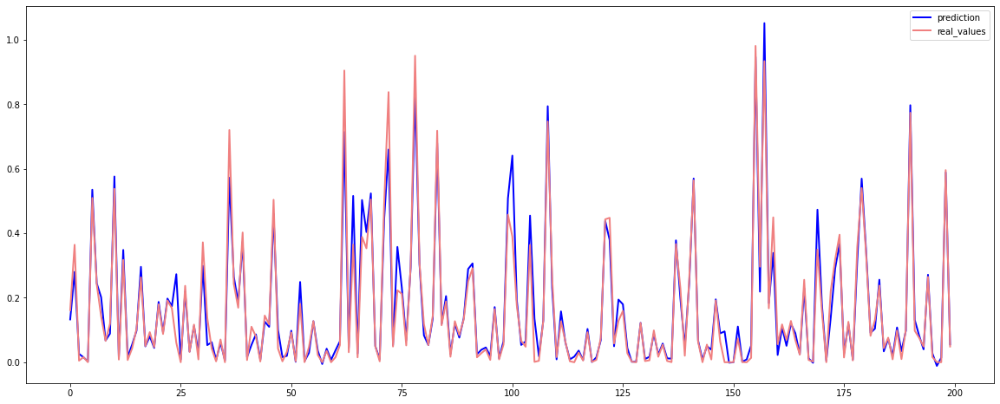

In [51]:
plt.figure(figsize=(20,8))
plt.plot(lr.predict(X_test[:200]), label="prediction", linewidth=2.0,color='blue')
plt.plot(y_test[:200].values, label="real_values", linewidth=2.0,color='lightcoral')
plt.legend(loc="best")
plt.savefig("L_Regression.png")
plt.show()

# Random Forest Regressor Model

In [52]:
rf = RandomForestRegressor()
rf.fit(X_train, y_train)

RandomForestRegressor()

In [53]:
rf_acc = rf.score(X_test,y_test)*100
print("Random Forest Regressor Accuracy - ",rf_acc)

Random Forest Regressor Accuracy -  97.87229412009304


In [54]:
y_pred = rf.predict(X_test)

In [55]:
print("MAE" , metrics.mean_absolute_error(y_test, y_pred))
print("MSE" , metrics.mean_squared_error(y_test, y_pred))
print("RMSE" , np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
print("R2" , metrics.explained_variance_score(y_test, y_pred))

MAE 0.015572519097617634
MSE 0.0009606379885369275
RMSE 0.030994160555448628
R2 0.9787233609325182


In [56]:
rf_df = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})

rf_df

,Actual,Predicted
Date,,
2011-08-05,0.161661,0.122750
2010-07-09,0.364278,0.320521
2011-07-01,0.005003,0.015227
2012-01-06,0.015856,0.020434
2011-08-26,0.000318,0.000529
...,...,...
2011-01-28,0.169068,0.176756
2010-08-20,0.252860,0.266226
2010-11-26,0.265617,0.386096


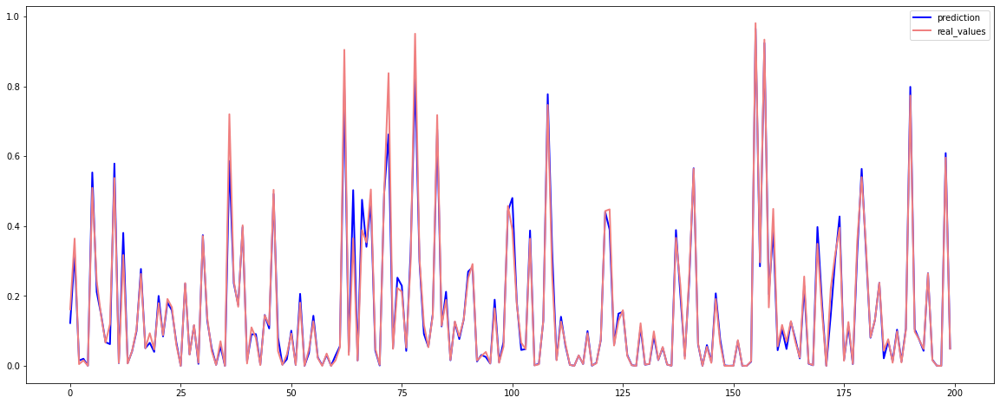

In [57]:
plt.figure(figsize=(20,8))
plt.plot(rf.predict(X_test[:200]), label="prediction", linewidth=2.0,color='blue')
plt.plot(y_test[:200].values, label="real_values", linewidth=2.0,color='lightcoral')
plt.legend(loc="best")
plt.savefig("Random_forest.png")
plt.show()

# K Neighbors Regressor Model

In [58]:
knn = KNeighborsRegressor(n_neighbors = 1,weights = 'uniform')
knn.fit(X_train,y_train)

KNeighborsRegressor(n_neighbors=1)

In [59]:
knn_acc = knn.score(X_test, y_test)*100
print("KNeigbhbors Regressor Accuracy - ",knn_acc)

KNeigbhbors Regressor Accuracy -  91.63500059784603


In [60]:
y_pred = knn.predict(X_test)

In [61]:
print("MAE" , metrics.mean_absolute_error(y_test, y_pred))
print("MSE" , metrics.mean_squared_error(y_test, y_pred))
print("RMSE" , np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
print("R2" , metrics.explained_variance_score(y_test, y_pred))

MAE 0.033423168304034065
MSE 0.0037767138191812447
RMSE 0.06145497391734248
R2 0.9165600793056727


In [62]:
knn_df = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})
knn_df

,Actual,Predicted
Date,,
2011-08-05,0.161661,0.112559
2010-07-09,0.364278,0.221307
2011-07-01,0.005003,0.011921
2012-01-06,0.015856,0.028551
2011-08-26,0.000318,0.001063
...,...,...
2011-01-28,0.169068,0.229475
2010-08-20,0.252860,0.262688
2010-11-26,0.265617,0.203904


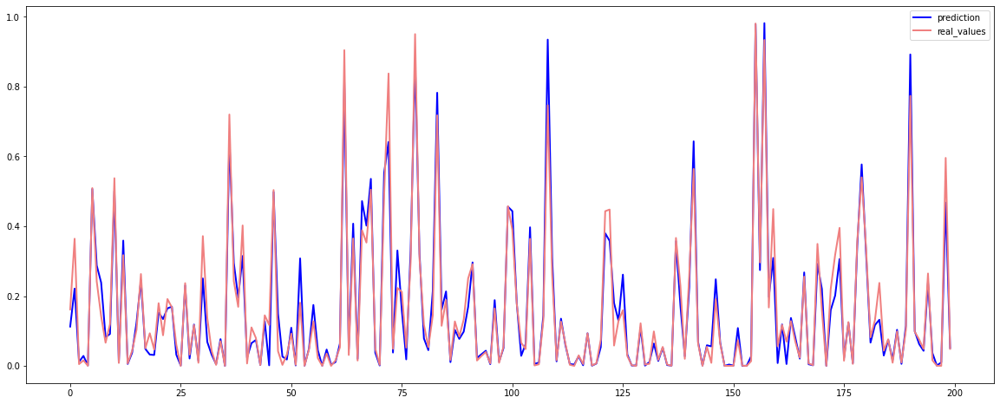

In [63]:
plt.figure(figsize=(20,8))
plt.plot(knn.predict(X_test[:200]), label="prediction", linewidth=2.0,color='blue')
plt.plot(y_test[:200].values, label="real_values", linewidth=2.0,color='lightcoral')
plt.legend(loc="best")
plt.show()

# Comapring Models

In [64]:
acc = {'model':['lr_acc','rf_acc','knn_acc'],'accuracy':[lr_acc,rf_acc,knn_acc]}

In [65]:
acc_df = pd.DataFrame(acc)
acc_df

,model,accuracy
0,lr_acc,92.278115
1,rf_acc,97.872294
2,knn_acc,91.635001


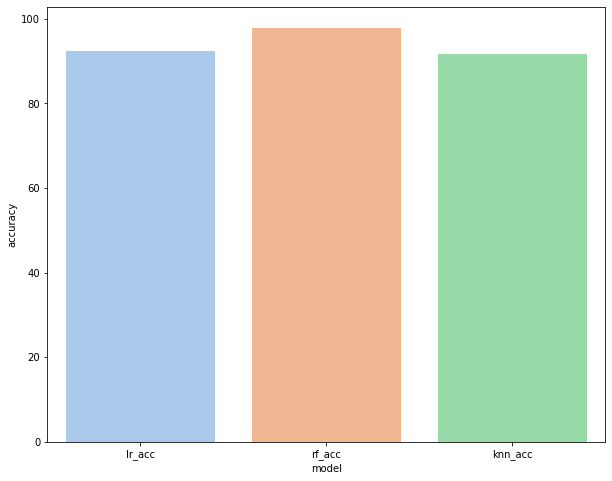

In [66]:
plt.figure(figsize=(10,8))
sns.barplot(x='model',y='accuracy',data=acc_df)
plt.show()